# Исследование рынка общественного питания Москвы

[Презентация](https://disk.yandex.ru/i/FkS6cE0EwyG_5w)

**Цель исследования** – проанализировать рынок общественного питания Москвы, найти интересные особенности и получить результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Ход исследования:**
1. Ознакомимся с данными и изучим общую информацию.
2. Выполним предобработку данных и подготовим данные к анализу.
3. Проведем анализ данных. Ответим на основные вопросы.
4. Детализируем исследование. Оценим возможность открытия кофейни по мотивам сериала "Друзья".
5. Сделаем общие выводы, подготовим презентацию.

**Описание данных:**\
\
*Файл /moscow_places.csv (информация о заведениях общественного питания Москвы)*\
\
`name` — название заведения;\
`address` — адрес заведения;\
`category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;\
`hours` — информация о днях и часах работы;\
`lat` — широта географической точки, в которой находится заведение;\
`lng` — долгота географической точки, в которой находится заведение;\
`rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);\
`price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;\
`avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона;\
`middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:\
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт;

`middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:\
* Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
* Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
* Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт;

`chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым;\
`district` — административный район, в котором находится заведение, например Центральный административный округ;\
`seats` — количество посадочных мест.

## 1. Ознакомимся с данными и изучим общую информацию

**Импортируем библиотеки, необходимые для исследования**

In [1]:
# загрузка библиотеки folium 
%pip install folium

# настроим нашу тетрадку так, чтобы все графики были картинками (пригодится для github)
%pip install -U kaleido -q
import plotly.io as pio
pio.renderers.default = "png"
from IPython.display import Image

# импорт библиотек
import pandas as pd
import numpy as np
import re
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly import graph_objects as go
from scipy import stats as st
import folium
from folium import Map, Choropleth
from folium import Marker, Map
from folium import Marker
from folium.plugins import MarkerCluster
import warnings
warnings.filterwarnings("ignore")

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


**Откроем датафрэйм с данными**

In [2]:
data = pd.read_csv('/Users/polinamokretsova/moscow_places.csv')
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


**Посмотрим общую информацию о данных**

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


**Мы имеем информацию о 8406 заведениях общественного питания Москвы:**
* название, категория, адрес, административный район, дни и часы работы, широта и долгота географической точки, рейтинг, категория цен, средний чек, число с оценкой среднего чека и число с оценкой одной чашки капучино, сетевое заведение или нет, количество посадочных мест.
* названия столбцов в датафрэйме удобно для использования (нижний регистр соблюдён).

Далее мы проведем предобработку данных. 

## 2. Выполним предобработку данных и подготовим данные к анализу

**Проверим данные на дубликаты**

In [4]:
data.duplicated().sum()

0

Явных дубликатов в данных нет.

**Проверим данные на пропущенные значения**

In [5]:
data.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64

Пропущенные значения имеются в столбцах:
* дни и часы работы;
* категория цен в заведении;
* средний чек;
* число с оценкой среднего чека;
* число с оценкой одной чашки капучино;
* количество посадочных мест.

Пропуски в middle_avg_bill и middle_coffee_cup могли появиться из-за пропусков в столбце avg_bill. 
Мы бы могли заменить средними значениями пропуски в некоторых данных или вручную проверили бы заведения и внесли недостающую информацию. Но на такой анализ потребуется гораздо больше времени и ресурсов, поэтмоу будем работать с тем, что имеем.

**Проведем предобротку данных в столбце с количеством посадочных мест**

In [6]:
# посмотрим общую информацию о столбце
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

**Среднее количество посадочных мест** – около 100.\
**Минимальное количество** - 0.\
**А максимальное** - больше 1000. Возможно, это крупные заведения с банкетными залами, но так же вероятно в этих данных скрыты выбросы.

**Посмотрим, в каких заведениях нет посадочных мест**

In [7]:
display(data[data['seats'] == 0].head(15))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
84,Meat Doner Kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,NaN,Средний счёт:300 ₽,300.0,NaN,0,0.0
177,Арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,NaN,NaN,NaN,NaN,1,0.0
196,Донер-Шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,NaN,NaN,NaN,NaN,0,0.0
203,Тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,NaN,NaN,NaN,NaN,1,0.0
211,Неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,NaN,NaN,NaN,NaN,0,0.0
266,Пекарня&Донер,булочная,"Москва, Широкая улица, 21",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887751,37.672475,4.1,NaN,NaN,NaN,NaN,0,0.0
284,Центр Плов,кафе,"Москва, Широкая улица, 16А",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.887348,37.662315,4.2,NaN,NaN,NaN,NaN,0,0.0
290,Шаурма,кафе,"Москва, Осташковская улица, 7, корп. 1",Северо-Восточный административный округ,NaN,55.877350,37.679414,3.3,NaN,NaN,NaN,NaN,0,0.0
306,Everest Coffee,кофейня,"Москва, Сходненская улица, 50",Северо-Западный административный округ,"пн-чт 08:00–22:00; пт 08:00–23:00; сб,вс 09:00...",55.847770,37.440586,4.9,средние,Цена чашки капучино:200–300 ₽,NaN,250.0,0,0.0
337,Пекарня Маковка,пиццерия,"Москва, Сходненская улица, 35, корп. 1",Северо-Западный административный округ,"ежедневно, 08:00–22:00",55.848505,37.439135,4.9,NaN,NaN,NaN,NaN,0,0.0


Посадочные места отсутствуют в основном в булочных, кафе, барах и пабах, в заведениях быстрого питания. В этих местах скорее всего можно взять еду на вынос, поэтому такие результаты не кажутся аномальными.

**А теперь посмотрим, в каких заведениях больше 1000 посадочных мест**

In [8]:
display(data[data['seats'] > 1000].head(15))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
2713,Ваня и Гоги,"бар,паб","Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 11:00–06:00",55.789842,37.750282,4.2,высокие,Средний счёт:1000–2500 ₽,1750.0,NaN,0,1040.0
2722,Маргарита,быстрое питание,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"ежедневно, 10:00–22:00",55.789527,37.752004,4.3,NaN,NaN,NaN,NaN,1,1040.0
2770,Шоколадница,кофейня,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,"пн-ср 11:00–23:00; чт 11:00–00:00; пт,сб 11:00...",55.789903,37.749822,4.1,NaN,NaN,NaN,NaN,1,1040.0
2966,Матрешка,кафе,"Москва, Измайловское шоссе, 71, корп. А",Восточный административный округ,NaN,55.789867,37.749656,4.0,NaN,NaN,NaN,NaN,0,1040.0
4231,РестоБар Argomento,столовая,"Москва, Кутузовский проспект, 41, стр. 1",Западный административный округ,"ежедневно, 12:00–23:00",55.738237,37.531819,4.2,высокие,Средний счёт:2500–5000 ₽,3750.0,NaN,0,1200.0
6518,DelonixCafe,ресторан,"Москва, проспект Вернадского, 94, корп. 1",Западный административный округ,"ежедневно, круглосуточно",55.652577,37.475730,4.1,высокие,Средний счёт:1500–2000 ₽,1750.0,NaN,0,1288.0
6524,Ян Примус,ресторан,"Москва, проспект Вернадского, 121, корп. 1",Западный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.657166,37.481519,4.5,выше среднего,Средний счёт:1500 ₽,1500.0,NaN,1,1288.0
6574,Мюнгер,пиццерия,"Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 08:00–21:00; сб,вс 10:00–21:00",55.667505,37.491001,4.8,NaN,NaN,NaN,NaN,1,1288.0
6641,One Price Coffee,кофейня,"Москва, проспект Вернадского, 84, стр. 1",Западный административный округ,"ежедневно, 08:30–20:00",55.665129,37.478635,4.3,NaN,NaN,NaN,NaN,1,1288.0
6658,ГудБар,"бар,паб","Москва, проспект Вернадского, 97, корп. 1",Западный административный округ,"пн-пт 11:00–23:00; сб,вс 13:00–23:00",55.667327,37.490601,4.1,средние,Средний счёт:700 ₽,700.0,NaN,0,1288.0


Полученные результаты вызывают сомнения и наталкивают на вероятность аномальных значениий:
* Если крупные рестораны могут иметь 1000 посадочных мест, то кафе, бары и пабы - точно нет.
* Мы заметили, что по некоторым адресам заведения имеют одинаковое большое количество посадочных мест. Например, несколько заведений по 1040 посадочных мест по идентичному адресу Измайловское шоссе, 71, корп. А. Или несколько заведений по 1288 посадочных мест на проспекте Вернадского. Скорее всего это ошибка при ручном наборе данных или ошибка выгрузки.
* Также не очень понятно, как в данные о заведениях попала Яндекс Лавка, ведь это не заведение общественного питания, а сервис доставки продуктов. Скорее всего Лавка такая не одна, но такой ручной анализ потребует больше времени.

In [9]:
# Создадим копию изначальео датафрэйма, чтобы в случае ошибок мы могли их отследить
filtered_data = data

# Заменим на "0" значения в "seats" у Яндекс Лавки
filtered_data.loc[(filtered_data['name'] == 'Яндекс Лавка', 'seats')] = 0

# Проверим, что значения в столбце "seats" у Яндекс Лавки поменялись
display(filtered_data[filtered_data['name'] == 'Яндекс Лавка'].head(10))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
162,Яндекс Лавка,ресторан,"Москва, Дмитровское шоссе, 107с17",Северный административный округ,"ежедневно, 07:00–00:00",55.881291,37.539301,4.3,NaN,NaN,NaN,NaN,1,0.0
193,Яндекс Лавка,ресторан,"Москва, Алтуфьевское шоссе, 79А, стр. 25",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.886778,37.584891,3.3,NaN,NaN,NaN,NaN,1,0.0
212,Яндекс Лавка,ресторан,"Москва, Алтуфьевское шоссе, 50",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.877394,37.587687,4.2,NaN,NaN,NaN,NaN,1,0.0
836,Яндекс Лавка,ресторан,"Москва, Дубнинская улица, 12, корп. 2",Северный административный округ,NaN,55.864447,37.569733,4.0,NaN,NaN,NaN,NaN,1,0.0
1041,Яндекс Лавка,ресторан,"Москва, улица Лётчика Бабушкина, 15",Северо-Восточный административный округ,"ежедневно, 07:00–00:00",55.863546,37.673501,4.2,NaN,NaN,NaN,NaN,1,0.0
1153,Яндекс Лавка,ресторан,"Москва, Будайский проезд, 1",Северо-Восточный административный округ,"ежедневно, 07:00–02:00",55.834932,37.664534,2.9,NaN,NaN,NaN,NaN,1,0.0
1443,Яндекс Лавка,ресторан,"Москва, Большой Волоколамский проезд, 12, корп...",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.801175,37.494331,4.0,NaN,NaN,NaN,NaN,1,0.0
1530,Яндекс Лавка,ресторан,"Москва, улица Викторенко, 16, стр. 5",Северный административный округ,"ежедневно, 07:00–00:00",55.794391,37.522755,4.2,NaN,NaN,NaN,NaN,1,0.0
1533,Яндекс Лавка,ресторан,"Москва, улица Космонавта Волкова, 6А",Северный административный округ,"ежедневно, 07:00–00:00",55.815155,37.512728,4.2,NaN,NaN,NaN,NaN,1,0.0
1541,Яндекс Лавка,ресторан,"Москва, Новохорошёвский проезд, 20",Северо-Западный административный округ,"ежедневно, 07:00–00:00",55.778370,37.493362,4.2,NaN,NaN,NaN,NaN,1,0.0


**Построим диаграмму размаха – ящик с усами для столбца "seats"**

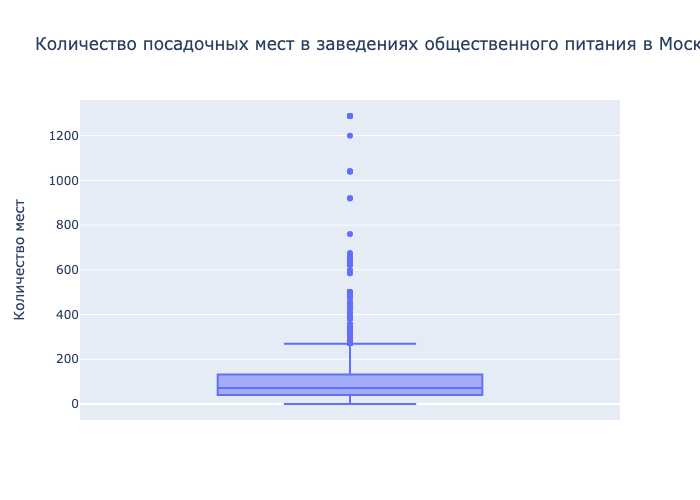

In [10]:
fig = px.box(filtered_data, y="seats", title='Количество посадочных мест в заведениях общественного питания в Москве',\
             labels={'seats': 'Количество мест'})
fig.show()

Как и предполагалось, аномальных значений в наших данных достаточно много. По диаграмме размаха видим, что выбросы начинаются в районе 300 посадочных мест.

**Добавим столбец street с названиями улиц из столбца с адресом**

In [11]:
# добавим столбец street
words = ['проезд','шоссе','улица','переулок','микрорайон','мкад','проспект','пр.',
         'площадь','аллея','бульвар','набережная','сквер','тупик','линия','территория', 'заказник',
         'квартал','просек', 'парк','мост', 'ул.']

str_pat = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))
 
filtered_data['street'] = filtered_data['address'].str.extract(str_pat, flags=re.I)

# посмотрим столбец
filtered_data['street']

0                 улица Дыбенко
1                 улица Дыбенко
2            Клязьминская улица
3       улица Маршала Федоренко
4           Правобережная улица
                 ...           
8401          Профсоюзная улица
8402      Пролетарский проспект
8403           Люблинская улица
8404           Люблинская улица
8405        Россошанский проезд
Name: street, Length: 8406, dtype: object

In [12]:
# проверим столбец street на пропуски
filtered_data['street'].isnull().sum()

135

Пропущенные строки у нас все же остались. Это могло произойти из-за того, что после элемента с ключевым словом нет запятой или в целом в названии улицы не было ключевого слова. Количество пропусков незначительное, их можно оставить.

**Добавим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)**

In [13]:
# добавив столбец is_24/7
filtered_data['is_24/7'] = filtered_data['hours'].str.contains('ежедневно, круглосуточно')

In [14]:
# проверим, что столбец добавлен
filtered_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


In [15]:
# посмотрим, сколько круглосуточных и некруглосуточных кофеен
filtered_data['is_24/7'].value_counts()

False    7140
True      730
Name: is_24/7, dtype: int64

**Добавим столбец total_places - количество заведений у сети общепита (если заведение всего 1, то оно не сетевое)**

In [16]:
# группируем данные в отдельный датасэт
total_places = filtered_data.groupby(['name']).agg({'name': 'count'}).rename(columns={'name':'total_places'}).reset_index()
total_places

,name,total_places
0,#КешбэкКафе,1
1,+39 Pizzeria Mozzarella bar,1
2,1 Этаж,1
3,1-я Креветочная,1
4,10 Идеальных Пицц,3
...,...,...
5609,Яръ,1
5610,Ясмин,1
5611,Ясно,1
5612,Яуза,1


**Обработаем столбец chain**\
Заменим для удобства значения в столбце:
* "0" - несетевое 
* "1" - сетевое

In [17]:
for i in filtered_data.index:
    if filtered_data.loc[i,'chain'] == 0:
        filtered_data.loc[i,'chain'] = 'несетевое'
    else:
        filtered_data.loc[i,'chain'] = 'сетевое'

In [18]:
# проверим, что изменения внесены корректно
filtered_data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,несетевое,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,несетевое,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,несетевое,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевое,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,сетевое,148.0,Правобережная улица,False


Мы провели предобработку данных:
* Проверили данные на дубликаты и пропуски.
* Проверили данные в столбце с количеством посадочных мест на выбросы и аномалии.
* Добавили столбец street с названиями улиц из столбца с адресом, это будет полезно нам в ходе анализа.
* Добавили столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно.
* Добавили столбец total_places с общим количеством заведением в "сети" (если заведение всего 1, то оно не сетевое).
* Заменили значения в столбце chain, чтобы было проще понимать сетевое место или несетевое.

## 3. Исследовательский анализ данных

**Какие категории заведений представлены в данных?**

In [19]:
# в отдельный датасэт сгруппируем заведения по категориям
categories = filtered_data.groupby('category')\
                          .agg({'category':'count'})\
                          .rename(columns={'category': 'count'})\
                          .sort_values(by='count', ascending=False)\
                          .reset_index()
categories

,category,count
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


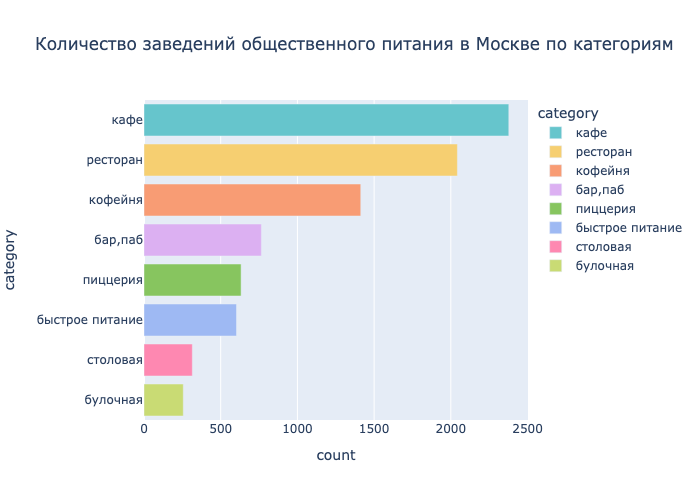

In [20]:
fig = px.bar(categories, x='count', y='category', title='Количество заведений общественного питания в Москве по категориям',\
             labels={'name': 'Количество заведений', 'total_places': 'Категория заведения'}, color='category',\
             color_discrete_sequence=px.colors.qualitative.Pastel)\
             .update_yaxes(categoryorder='total ascending')
fig.show()

Что можно сказать по поводу количества заведений общественного питания в Москве по категориям: 
1. Больше всего кафе и ресторанов – их в сумме больше 4000 заведений.
2. На третьем месте с отрывом идут кофейни – 1400 заведений.
3. Меньше всего столовых и булочных.

**Исследуем количество посадочных мест в заведениях по категориям**

In [21]:
# в отдельную переменную добавим все заведения, кроме тех, где в столбце seats мы оставили маркер "-100500"
sum_seats = filtered_data.loc[filtered_data['seats'] != -100500]

# сгруппируем датафрэум по категориям и посчитаем медианное количество мест в заведениях
sum_seats = sum_seats.groupby('category')\
                          .agg({'seats':'median'})\
                          .rename(columns={'seats': 'sum_seats'})\
                          .sort_values(by='sum_seats', ascending=False)\
                          .reset_index()
sum_seats

,category,sum_seats
0,"бар,паб",82.5
1,кофейня,80.0
2,ресторан,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


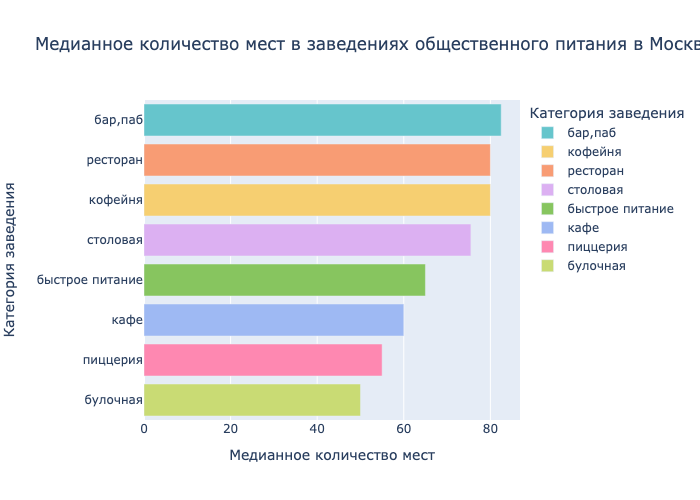

In [22]:
fig = px.bar(sum_seats, x='sum_seats', y='category', title='Медианное количество мест в заведениях общественного питания в Москве',\
             labels={'sum_seats': 'Медианное количество мест', 'category': 'Категория заведения'}, color='category',\
             color_discrete_sequence=px.colors.qualitative.Pastel)\
            .update_yaxes(categoryorder='total ascending')
fig.show()

**Больше всего мест** (в среднем 82-83) в барах, пабах и ресторанах.\
**Чуть меньше мест** (до 80) в ресторанах и кофейнях.\
**Меньше всего мест** (до 50) в булочных.

**Рассмотрим и изобразим соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

In [23]:
chain_notchain = filtered_data.groupby('chain')\
                            .agg({'name':'count'})\
                            .sort_values(by='name', ascending=False)\
                            .reset_index()\
                            .rename(columns={'name': 'total_places'})
chain_notchain

,chain,total_places
0,несетевое,5201
1,сетевое,3205


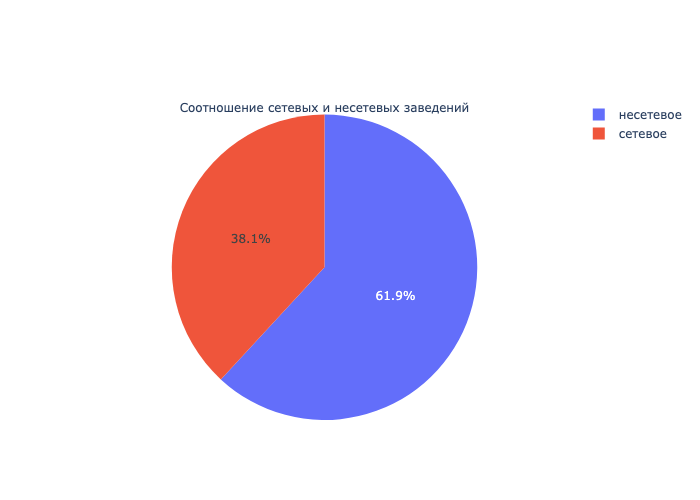

In [24]:
fig = go.Figure(data=[go.Pie(labels=chain_notchain['chain'], values=chain_notchain['total_places'], title='Соотношение сетевых и несетевых заведений')])
fig.show()

**Несетевых заведений больше** - они составляют **61.9%** от общего количества заведений. Их количество - 5201.\
**Сетевые заведения составляют 38.1%.** Их количество - 3205.

**Узнаем, какие категории заведений чаще являются сетевыми. Исследуем данные и визуализируем.**

In [25]:
chain = (
    filtered_data
    .groupby(['category','chain'], as_index=False)['name']
    .count()
    .sort_values(by='name')
)

In [26]:
chain

,category,chain,name
15,столовая,сетевое,88
2,булочная,несетевое,99
3,булочная,сетевое,157
1,"бар,паб",сетевое,169
14,столовая,несетевое,227
5,быстрое питание,сетевое,232
10,пиццерия,несетевое,303
11,пиццерия,сетевое,330
4,быстрое питание,несетевое,371
0,"бар,паб",несетевое,596


In [27]:
data_chain = pd.merge(chain, categories, on=['category'], how='left')
data_chain['share'] = round(data_chain['name']/data_chain['count']*100)
data_chain

,category,chain,name,count,share
0,столовая,сетевое,88,315,28.0
1,булочная,несетевое,99,256,39.0
2,булочная,сетевое,157,256,61.0
3,"бар,паб",сетевое,169,765,22.0
4,столовая,несетевое,227,315,72.0
5,быстрое питание,сетевое,232,603,38.0
6,пиццерия,несетевое,303,633,48.0
7,пиццерия,сетевое,330,633,52.0
8,быстрое питание,несетевое,371,603,62.0
9,"бар,паб",несетевое,596,765,78.0


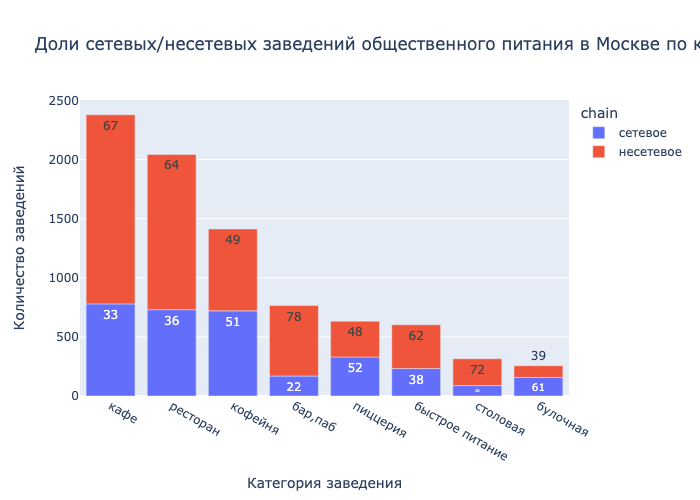

In [28]:
fig = px.bar(data_chain, x="category", y="name", color="chain", text="share",
            labels={'category': 'Категория заведения', 'name': 'Количество заведений'},
            title='Доли сетевых/несетевых заведений общественного питания в Москве по категориям')\
        .update_xaxes(categoryorder='total descending')
fig.show()

Несмотря на то, что сетевых кафе больше всего по количеству, если сравнивать доли сетевых заведений относительно общего количества заведений по категориям, лидируют **булочные**.\
**Меньше всего:** баров и пабов. 

**Топ-15 популярных сетей в Москве**

Сгруппируем данные по названиям заведений и найдем топ-15 популярных сетей в Москве.

**Посмотрим топ-15 по количеству заведений в сети**

In [29]:
top_15_places = filtered_data.loc[filtered_data['chain'] == 'сетевое']\
                        .groupby('name')\
                        .agg({'district' : 'count', 'category' : pd.Series.mode})\
                        .sort_values('district', ascending = False)\
                        .rename(columns={"district": "total_places"})\
                        .reset_index()\
                        .head(15) 
top_15_places

,name,total_places,category
0,Шоколадница,120,кофейня
1,Домино'с Пицца,76,пиццерия
2,Додо Пицца,74,пиццерия
3,One Price Coffee,71,кофейня
4,Яндекс Лавка,69,ресторан
5,Cofix,65,кофейня
6,Prime,50,ресторан
7,Хинкальная,44,кафе
8,КОФЕПОРТ,42,кофейня
9,Кулинарная лавка братьев Караваевых,39,кафе


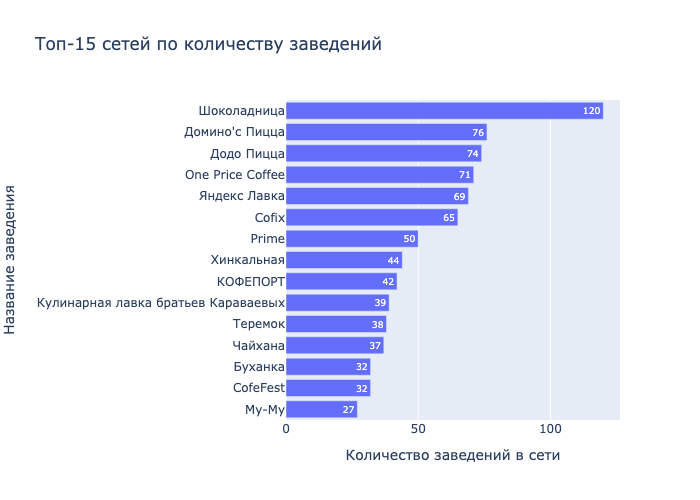

In [30]:
# визуализируем топ-15 на графике
fig = px.bar(top_15_places, x='total_places', y='name', title='Топ-15 сетей по количеству заведений', text='total_places',
             labels={'name': 'Название заведения', 'total_places': 'Количество заведений в сети'})\
        .update_yaxes(categoryorder='total ascending')
fig.show()

Заведения, попавшие в топ-15, не удивили. Топ открывает Шоколадница, которой действительно много по городу. За ней идут популярные представители пиццерий - Доминос и Додо Пицца, кофе - Cofix и One Price Coffee и т.д.

**Посмотрим на диаграмме, как распределяются категории топ-15 популярных сетей общественного питания.**

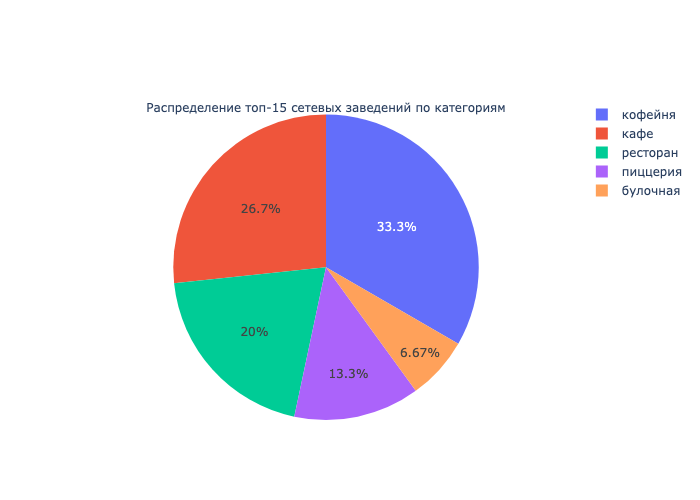

In [31]:
# топ-15 по количеству заведений сети
fig = go.Figure(data=[go.Pie(labels=top_15_places['category'], title='Распределение топ-15 сетевых заведений по категориям')])
fig.show()

**Больше всего среди популярных сетевых заведений - кофеен и кафе** (только у кофейни Шоколадницы 120 заведений). Далее идут рестораны, но в наших данных рестораны представлены не в классическом понимании, а такие, как Яндекс Лавка (сервис доставки), Prime (кафе, быстрое питание, еда на вынос), Теремок (также заведение быстрого питания, несмотря на позиционирование, как ресторан).

**Для интереса посмотрим топ-15 по среднему рейтингу заведений сети**

In [32]:
top_15_rating = filtered_data.loc[filtered_data['chain'] == 'сетевое']\
                        .groupby('name')\
                        .agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})\
                        .sort_values('rating', ascending = False)\
                        .rename(columns={"district": "total_places"})\
                        .reset_index()\
                        .head(15) 
top_15_rating

,name,rating,category,total_places
0,Zамания,4.90,пиццерия,6
1,Находка,4.90,ресторан,3
2,БарБариста,4.90,кофейня,2
3,Мясо на углях,4.90,кафе,1
4,Drive,4.90,кафе,1
5,Ком 1989,4.90,кафе,2
6,We Cidreria,4.90,"бар,паб",2
7,Баку,4.90,кафе,1
8,Хинкали-Gали!,4.90,кафе,5
9,Ла Гатта,4.90,пиццерия,3


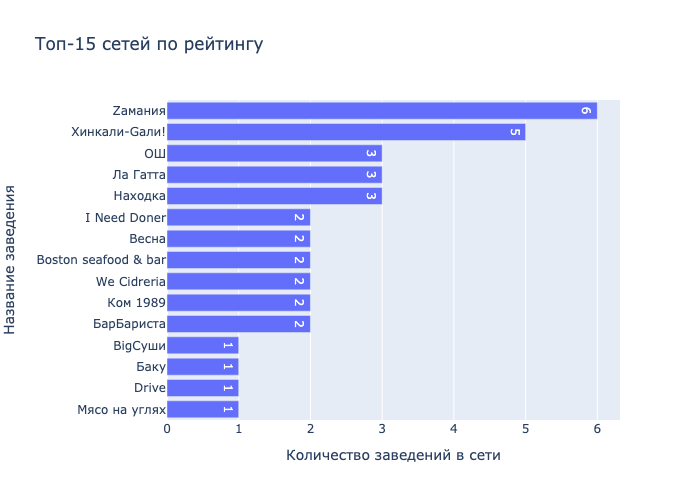

In [33]:
# визуализируем топ-15 на графике
fig = px.bar(top_15_rating, x='total_places', y='name', title='Топ-15 сетей по рейтингу', text='total_places',
             labels={'name': 'Название заведения', 'total_places': 'Количество заведений в сети'})\
        .update_yaxes(categoryorder='total ascending')
fig.show()

Интересно, что топ-15 по рейтингу отличается от топа по количеству заведений сети. Но как мы видим - в топе по рейтингу маленькие сети от 2 до 6 заведений. Можно предположить, что чем больше заведений - тем больше отзывов (и хороших, и плохих) и неоднозначнее рейтинг.

В этом списке заведения уже не такие очевидные, но среди них все же есть знакомые.

**Посмотрим на диаграмме, как распределяются категории топ-15 популярных сетей общественного питания**

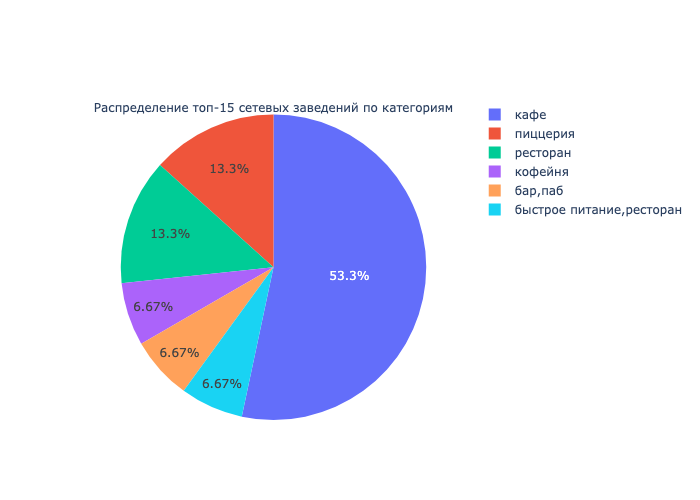

In [34]:
# топ-15 по рейтингу
fig = go.Figure(data=[go.Pie(labels=top_15_rating['category'], title='Распределение топ-15 сетевых заведений по категориям')])
fig.show()

Если рассматривать топ-15 сетевых заведений по рейтингу, то тут по количеству лидируют кафе. Это сходится и с топом по количеству заведений (там лидировали кофейни и кафе).

Далее будем рассматривать только топ-15 по количеству заведений в сети.

**Отобразим общее количество заведений и количество заведений каждой категории по районам**

In [35]:
# посчитаем общее количество заведений по каждой категории и добавим данные в отдельную переменную
top_15_total = top_15_places.groupby('category')['total_places'].sum().to_frame().sort_values(by='total_places', ascending=False).reset_index()
top_15_total

,category,total_places
0,кофейня,330
1,ресторан,157
2,пиццерия,150
3,кафе,147
4,булочная,32


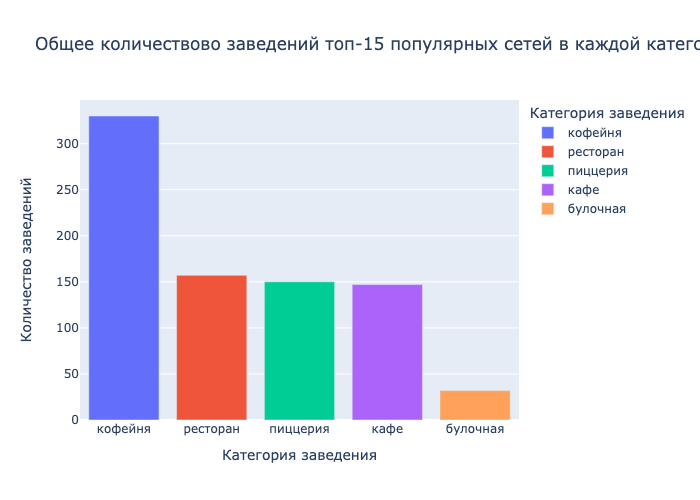

In [36]:
# визуализируем полученные данные
fig = px.bar(top_15_total, x='category', y='total_places', color="category",\
             labels={'category': 'Категория заведения', 'total_places': 'Количество заведений'},\
             title='Общее количествово заведений топ-15 популярных сетей в каждой категории')

fig.show() 

Распределение количества заведений в популярных сетях общепита по категориям показало, что больше всего среди таких заведений - кофеен.

**Посмотрим на количество заведений каждой категории из топ-15 по районам**

In [37]:
# создадим список с названиями популярных сетей
top_15_names = top_15_places['name']

# соберем табличку, куда войдут эти сети, их местоположение (район) и количество 
top_15_districts = filtered_data.loc[filtered_data['name'].isin(top_15_names)]
top_15_districts = top_15_districts.groupby(['district', 'category'])['name'].count().to_frame().reset_index()
top_15_districts.columns = ['district', 'category', 'count']
top_15_districts

,district,category,count
0,Восточный административный округ,"бар,паб",2
1,Восточный административный округ,булочная,1
2,Восточный административный округ,быстрое питание,2
3,Восточный административный округ,кафе,6
4,Восточный административный округ,кофейня,30
5,Восточный административный округ,пиццерия,20
6,Восточный административный округ,ресторан,18
7,Восточный административный округ,столовая,1
8,Западный административный округ,булочная,5
9,Западный административный округ,быстрое питание,1


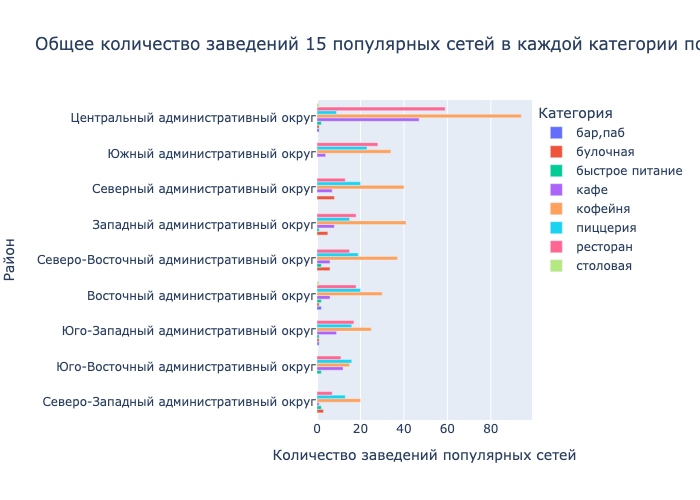

In [38]:
# визуализируем
fig = px.bar(top_15_districts, y='district',  x='count', color="category", barmode='group', labels={
                     'district': 'Район', 'count': 'Количество заведений популярных сетей', 'category': 'Категория'
                     }, title='Общее количество заведений 15 популярных сетей в каждой категории по районам')\
        .update_yaxes(categoryorder='total ascending')
fig.show() 

Распределение популярных сетей по округам подтверждает факт, что в каждом районе больше всего кофеен. На втором месте - рестораны или пиццерии.

**Посмотрим, какие административные районы Москвы присутствуют в датасете**

Выведем все административные районы и посчитаем количество заведений в них.

In [39]:
district_total_places = filtered_data['district'].value_counts().to_frame()
district_total_places

,district
Центральный административный округ,2242
Северный административный округ,900
Южный административный округ,892
Северо-Восточный административный округ,891
Западный административный округ,851
Восточный административный округ,798
Юго-Восточный административный округ,714
Юго-Западный административный округ,709
Северо-Западный административный округ,409


В нашем датасете представлено 9 административных округов Москвы. Больше всего заведений в Центральном, меньше всего - в Северо-Западном.

А теперь посмотрим на количество заведений в районах по категориям.

In [40]:
places_districts = filtered_data.groupby(['district', 'category'])['name'].count().to_frame().reset_index()
places_districts.columns = ['district', 'category', 'count']
places_districts

,district,category,count
0,Восточный административный округ,"бар,паб",53
1,Восточный административный округ,булочная,25
2,Восточный административный округ,быстрое питание,71
3,Восточный административный округ,кафе,272
4,Восточный административный округ,кофейня,105
...,...,...,...
67,Южный административный округ,кафе,264
68,Южный административный округ,кофейня,131
69,Южный административный округ,пиццерия,73
70,Южный административный округ,ресторан,202


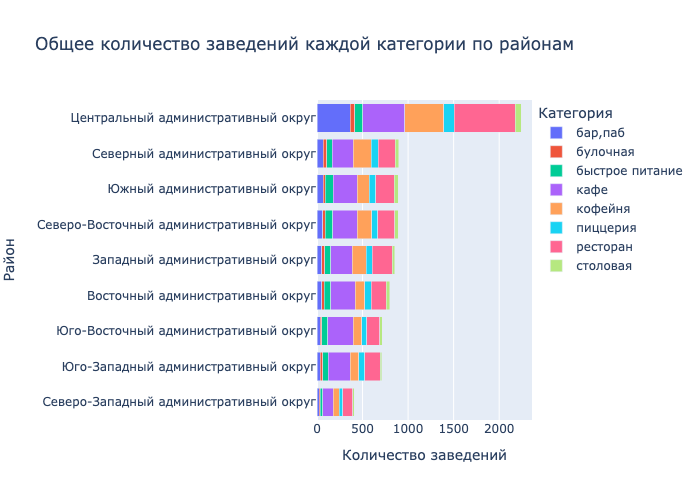

In [41]:
# построим график для визуализации
fig = px.bar(places_districts, y='district',  x='count', color="category", barmode='stack', labels={
                     'district': 'Район', 'count': 'Количество заведений', 'category': 'Категория'
                     }, title='Общее количество заведений каждой категории по районам')\
        .update_yaxes(categoryorder='total ascending')
fig.show() 

Если смотреть на районы Москвы в общем, то видно, что в большинстве районов преобладают кафе. Отличается только Центральный район - там больше всего ресторанов, а кафе на втором месте.

**Визуализируем распределение средних рейтингов по категориям заведений. Узнаем, сильно ли различаются усреднённые рейтинги в разных типах общепита**

In [42]:
ratings_categories = filtered_data.groupby('category')['rating'].mean()\
                                  .round(3)\
                                  .sort_values(ascending=False)\
                                  .reset_index()
ratings_categories

,category,rating
0,"бар,паб",4.388
1,пиццерия,4.301
2,ресторан,4.290
3,кофейня,4.277
4,булочная,4.268
5,столовая,4.211
6,кафе,4.124
7,быстрое питание,4.050


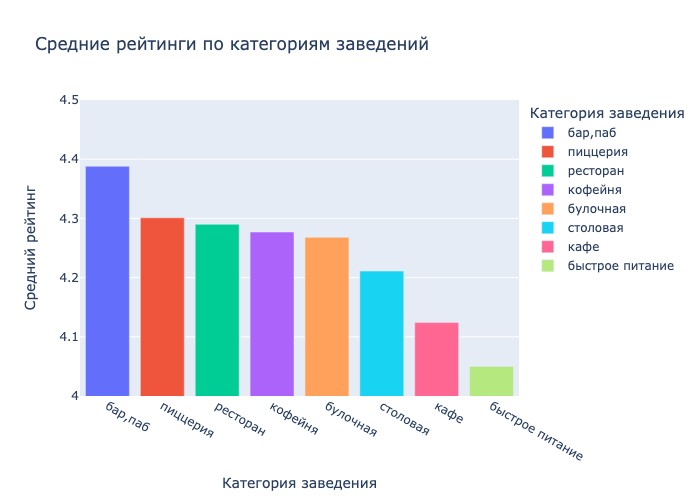

In [43]:
# визуализируем полученные данные
fig = px.bar(ratings_categories, x='category', y='rating', color="category", labels={
                     'category': 'Категория заведения', 'rating': 'Средний рейтинг'
                     },title='Средние рейтинги по категориям заведений')
fig.update_yaxes(range=[4, 4.5])
fig.show() 

Как мы видим, усреднённые рейтинги в разных типах общепита практически не отличаются: в среднем от 4 до 4,4. Выше всего рейтинги у баров и пабов. Меньше всего - у ресторанов быстрого питания. 

**Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района**

In [44]:
rating_data = filtered_data.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_data

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
3,Северо-Восточный административный округ,4.2
6,Юго-Восточный административный округ,4.2


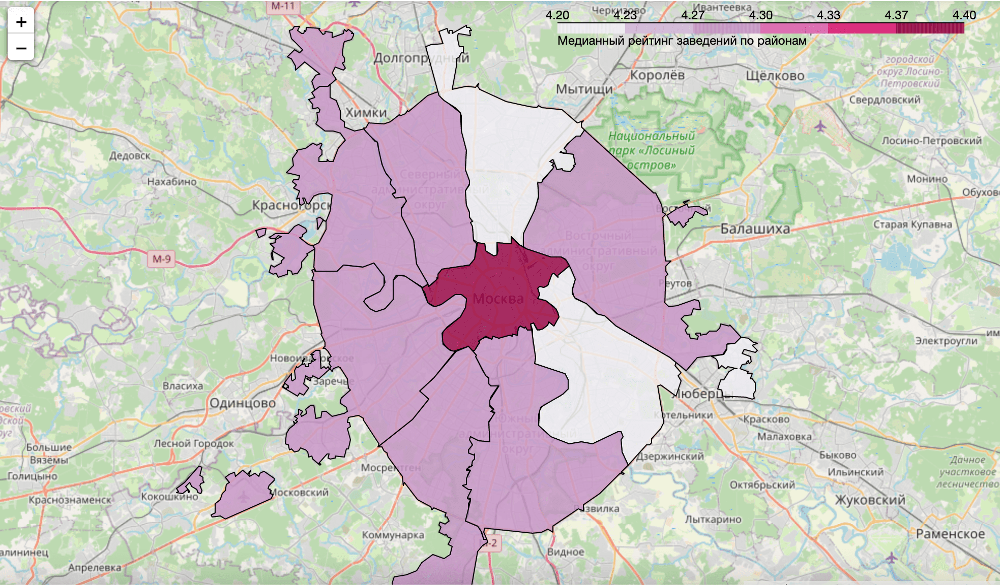

In [45]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/polinamokretsova/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_data,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

# выводим карту
# m

Image(filename='image.png')

Карта подтверждает наши данные – **в центральном районе рейтинг выше.**

**Отобразим все заведения датасета на карте с помощью кластеров.**

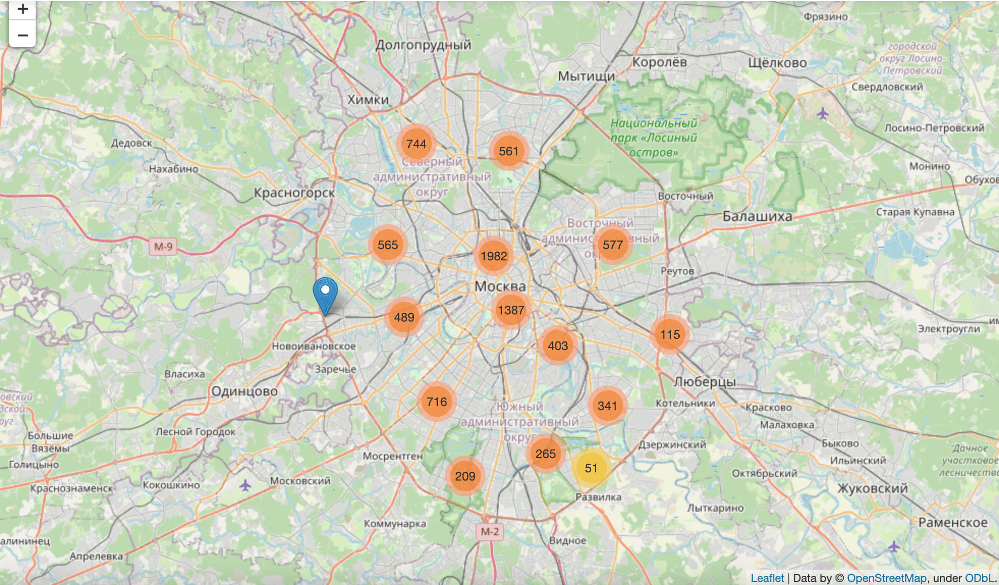

In [46]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
# m

Image(filename='image1.png')

Распределение заведений по кластерам подтвердило наши данные, что больше всего заведений собраны в Центральном районе Москвы.

**Найдём топ-15 улиц по количеству заведений. Построим график распределения количества заведений и их категорий по этим улицам.**

In [47]:
streets_name = filtered_data.groupby('street')\
                        .agg({'district' : 'count'})\
                        .sort_values('district', ascending = False)\
                        .rename(columns={"district": "total_places"})\
                        .reset_index()\
                        .head(15) 

streets_name

,street,total_places
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,75
8,Ленинградское шоссе,69
9,МКАД,65


In [48]:
# создадим список с названиями популярных сетей
top_15_name_streets = streets_name['street']

# соберем табличку, куда войдут эти улицы, количество заведений и категории
top_15_streets = filtered_data.loc[filtered_data['street'].isin(top_15_name_streets)]
top_15_streets = top_15_streets.groupby(['street', 'category'])['name'].count().to_frame().reset_index()
top_15_streets.columns = ['street', 'category', 'count']
top_15_streets

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,17
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,21
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


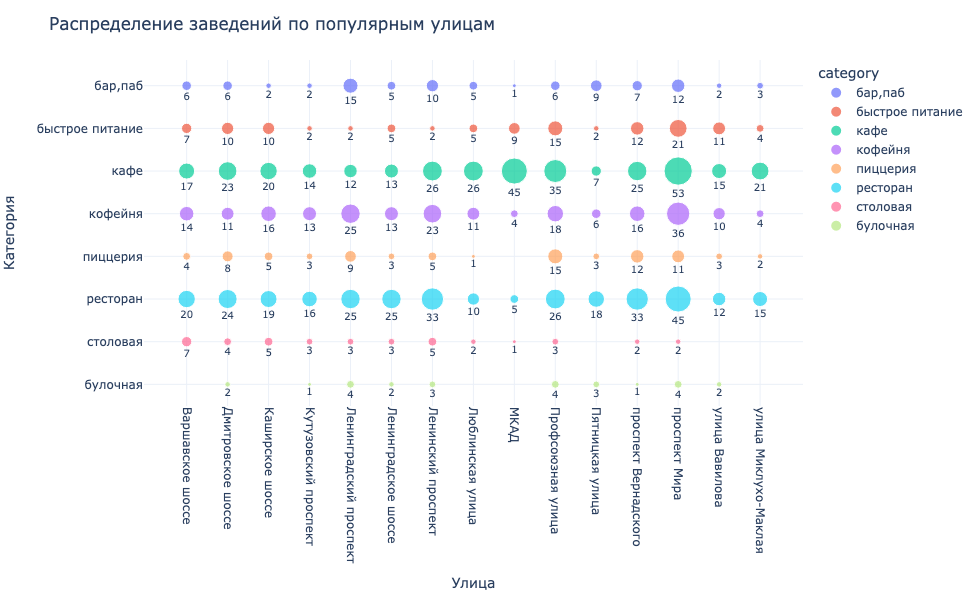

In [49]:
fig = px.scatter(
    top_15_streets,
    x='street',
    y='category',
    size='count',
    color='category',
    text='count'
      )

fig.update_xaxes(
    tickangle=90
)

fig.update_traces(
    textposition="bottom center",
    textfont_size=10
)

fig.update_layout(
    title='Распределение заведений по популярным улицам',
    xaxis_title='Улица',
    yaxis_title='Категория',
    width=980,
    height=600,
    template="plotly_white"
)

fig.show()

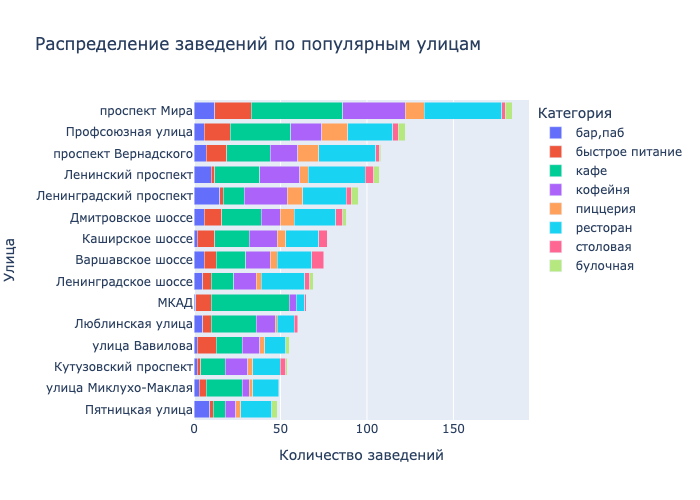

In [50]:
# построим еще один график для визуализации
fig = px.bar(top_15_streets, y='street',  x='count', color="category", barmode='stack', labels={
                     'street': 'Улица', 'count': 'Количество заведений', 'category': 'Категория'
                     }, title='Распределение заведений по популярным улицам')\
        .update_yaxes(categoryorder='total ascending')
fig.show() 

Больше всего заведений сосредоточено на проспекте Мира: кафе, рестораны, кофейни, рестораны быстрого питания.

**Найдём улицы, на которых находится только один объект общепита**

In [51]:
# для начала соберем датасет, куда войдут все улицы и количество заведений на них
streets_places = filtered_data.groupby('street')\
                        .agg({'district' : 'count'})\
                        .sort_values('district')\
                        .rename(columns={"district": "total_places"})\
                        .reset_index() 

# отфильтруем датасет, оставим только те улицы, где одно заведение
streets_1place = streets_places[streets_places['total_places'] == 1]
streets_1place

,street,total_places
0,1-й Автозаводский проезд,1
1,Новомосковская улица,1
2,Новопоселковая улица,1
3,Новороссийская улица,1
4,Новосущёвская улица,1
...,...,...
420,1-й Капотнинский проезд,1
421,Булатниковский проезд,1
422,2-й Вышеславцев переулок,1
423,Брянская улица,1


**Всего 425 улиц в Москве, на которых всего один объект общепита. Посмотрим, где они располагаются**

In [52]:
# в переменную streets_1place добавим все названия улиц с одним заведением 
streets_1place = streets_1place['street']
# создадим датасет streets_place, куда войдет вся информация об удицах с одним заведением
streets_place = filtered_data.loc[filtered_data['street'].isin(streets_1place)]

Посмотрим, какие категории заведений общепита единственные открыты на некоторых улицах Москвы.

In [53]:
categories1 = streets_place.groupby('category')['name'].count().to_frame().sort_values('name', ascending=False).reset_index()
categories1

,category,name
0,кафе,142
1,ресторан,90
2,кофейня,74
3,"бар,паб",40
4,столовая,36
5,быстрое питание,20
6,пиццерия,14
7,булочная,9


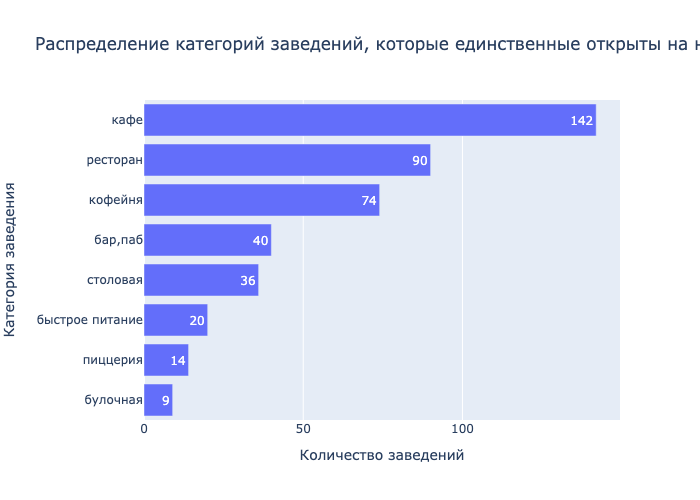

In [54]:
# визуализируем на графике
fig = px.bar(categories1, x='name', y='category', title='Распределение категорий заведений, которые единственные открыты на некоторых улицах Москвы',
             text='name', labels={'category': 'Категория заведения', 'name': 'Количество заведений'})\
        .update_yaxes(categoryorder='total ascending')
fig.show()

Чаще всего единственными заведениями общепита на улицах Москвы являются кафе.

Отметим на карте эти заведения, чтобы узнать, как они расположены в Москве.

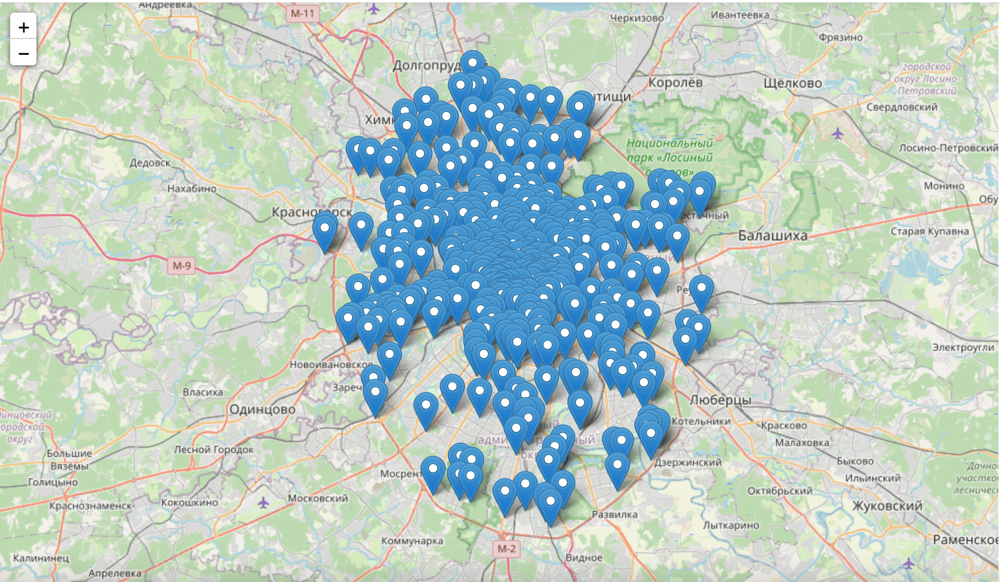

In [55]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
streets_place.apply(create_marker, axis=1)
    
# выводим карту
# m

Image(filename='image2.png')

Как мы видим, улицы с одним заведением распределены по всей Москве. Особенно много таких заведений в центре города.

**Теперь посмотрим на средние чеки заведений. Посчитаем медиану среднего чека для каждого района.**

In [56]:
bill_data = filtered_data.groupby('district', as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill', ascending=False)
bill_data

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


**Построим фоновую картограмму с полученными значениями для каждого района**

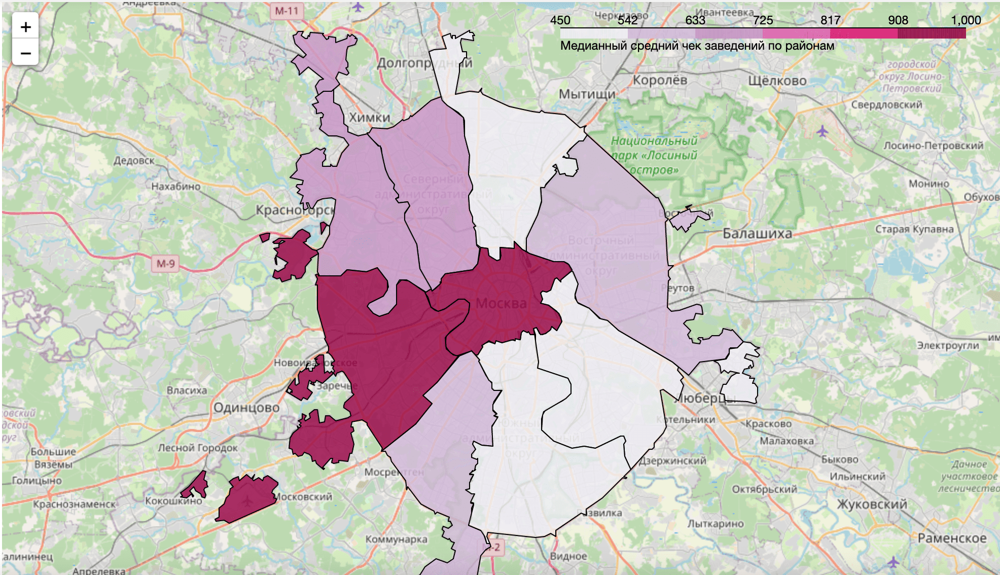

In [57]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/polinamokretsova/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=bill_data,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианный средний чек заведений по районам',
).add_to(m)

# выводим карту
# m

Image(filename='image3.png')

В целом наблюдается тенденция - **чем дальше от центра, тем меньше средний чек**. Однако есть исключение – Западный округ.\
\
**Самые высокие средние чеки в заведениях Центрального и Западного округов**. Предтставителями Западного округа являются дорогие районы Москвы: микрорайон Рублево и Сколково, а также Внуково (средний чек, вероятно, высокий из-за аэропорта, где цены выше обычных).


**Подведем промежуточный итог анализа заведений общественного питания в Москве:**
1. **Категории заведений:** по категориям заведений общепита в столице лидируют кафе и рестораны. Меньше всего булочных и столовых.
2. **Посадочные места:** больше всего посадочных мест (чуть больше 80) в барах и пабах. Чуть меньше мест (80) в ресторанах и кофейнях. Меньше всего мест (до 50) в булочных.
3. **Несетевые VS сетевые заведения:** несетевых заведений больше половины - они составляют 60.9% от общего количества заведений. Сетевых - 39.1%.
4. **Категории сетевых заведений:** несмотря на то, что сетевых кафе больше всего по количеству, если сравнивать доли сетевых заведений относительно общего количества заведений по категориям, лидируют булочные. Меньше всего: баров и пабов.
5. **Топ-15 популярных сетевых заведений:** мы определили топ-15 популярных сетей общепита. Топ открывает Шоколадница, за ней идут всем знакомые представители пиццерий - Доминос и Додо Пицца, кофе - Cofix и One Price Coffee и т.д. 
6. **Категории популярных сетевых заведений:** больше всего среди популярных сетевых - кофеен (только у кофейни Шоколадницы 115 заведений). Кроме того, мы рассмотрели топ-15 сетевых заведений по рейтингу, и в этом случае по количеству лидировали кафе. 
7. **Распределение популярных сетевых заведений по городу:** распределение популярных сетей по городу и отдельно по районам подтвердило факт, что в каждом районе больше всего кофеен. На втором месте - рестораны/пиццерии.
8. **Административные округа и заведения общепита:**\
\
В нашем датасете представлено 9 административных округов Москвы. Больше всего заведений общепита в Центральном, меньше всего - в Северо-Западном. Если смотреть на районы столицы в общем, то видно, что в большинстве районов преобладают кафе. Отличается только Центральный район - там больше всего ресторанов, а кафе на втором месте.\
\
Усреднённые рейтинги в разных типах общепита практически не отличаются: в среднем от 4 до 4,4. Выше всего рейтинги у баров и пабов. Меньше всего - у ресторанов быстрого питания. Построив визуализацию данных на карте города мы подтвердили, что в центральном районе рейтинг выше, но незначительно.\
\
Мы нашли топ-15 улиц по количеству заведений и выяснили, что больше всего заведений сосредоточено на проспекте Мира: кафе, рестораны, кофейни, рестораны быстрого питания.\
\
Также мы нашли 425 улиц в Москве, на которых находится всего один объект общепита. И больше всего таких улиц в центре города. Чаще всего такими заведениями являются кафе.\
\
Мы посмотрели на средние чеки заведений и посчитали медиану среднего чека для каждого района. В целом наблюдается тенденция - чем дальше от центра, тем меньше средний чек. Однако есть исключение – Западный округ. Самые высокие средние чеки в заведениях Центрального и Западного округов. Предтставителями Западного округа являются дорогие районы Москвы: микрорайон Рублево и Сколково, а также Внуково (средний чек, вероятно, высокий из-за аэропорта, где цены выше обычных).

## 4. Детализируем исследование. Оценим возможность открытия кофейни

**Посмотрим, сколько всего кофеен в датасете**

In [58]:
coffeeshops = filtered_data[filtered_data['category'] == 'кофейня']['name'].count()
print(f'Всего {coffeeshops} кофеен в датасете.')

Всего 1413 кофеен в датасете.


In [59]:
# в отдельный датасет соберем все кофейни
coffeeshops = filtered_data[filtered_data['category'] == 'кофейня']
coffeeshops_districts = coffeeshops.groupby('district')['name'].count().to_frame().sort_values(by='name', ascending=False).reset_index()
coffeeshops_districts.columns = ['district', 'count']
coffeeshops_districts

,district,count
0,Центральный административный округ,428
1,Северный административный округ,193
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


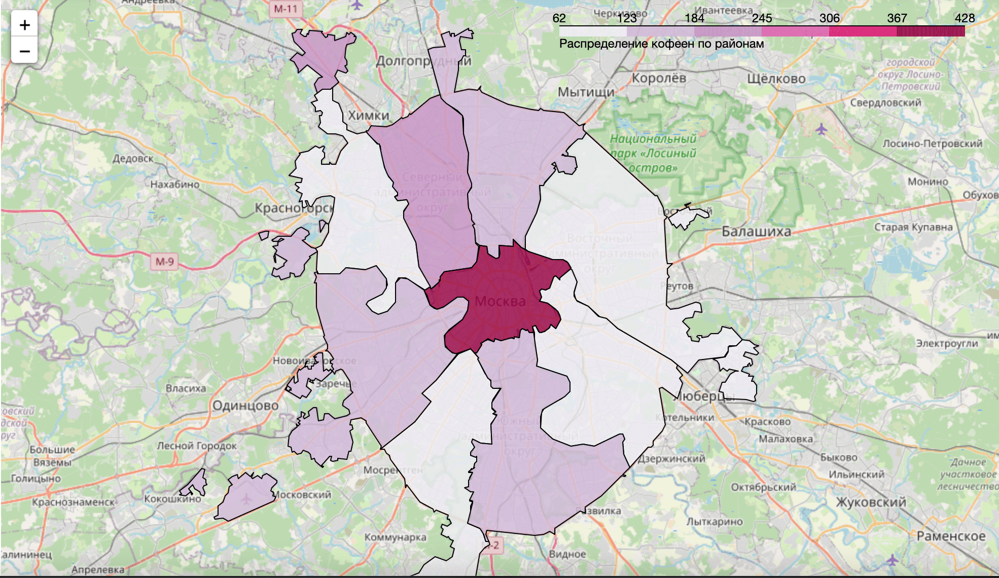

In [60]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/polinamokretsova/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffeeshops_districts,
    columns=['district', 'count'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Распределение кофеен по районам',
).add_to(m)

# выводим карту
# m

Image(filename='image4.png')

**Особенности расположения кофеен в Москве:**
1. Больше всего кофеен расположено в центре города.
2. Среднее количество кофеен в Северном, Северо-Восточном, Западном, Южном административных округах.
3. Меньше всего кофеен в Северо-Западном, Восточном, Юго-Восточном и Юго-Западном административных округах.

**Посмотрим, есть ли круглосуточные кофейни в Москве**

In [61]:
coffeeshops[coffeeshops['is_24/7'] == True]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,Wild Bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,сетевое,20.0,Дмитровское шоссе,True
971,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,сетевое,25.0,Ярославское шоссе,True
1047,Wild Bean Cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,сетевое,NaN,Ярославское шоссе,True
1214,Wild Bean Cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,сетевое,NaN,МКАД,True
1291,Шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,сетевое,200.0,улица Народного Ополчения,True
1468,Кофе Хауз,кофейня,"Москва, Ленинградский проспект, 74",Северный административный округ,"ежедневно, круглосуточно",55.805239,37.516246,4.0,NaN,Цена чашки капучино:235–335 ₽,NaN,285.0,сетевое,NaN,Ленинградский проспект,True
1790,Кофемания,кофейня,"Москва, Ленинградский проспект, 37А, корп. 14,...",Северный административный округ,"ежедневно, круглосуточно",55.790899,37.542776,4.7,NaN,NaN,NaN,NaN,сетевое,15.0,Ленинградский проспект,True
1825,You&coffee,кофейня,"Москва, улица Золоторожский Вал, 11, стр. 21",Северный административный округ,"ежедневно, круглосуточно",55.803924,37.582251,4.2,NaN,NaN,NaN,NaN,сетевое,NaN,улица Золоторожский Вал,True
1883,Кофемания,кофейня,"Москва, Лесная улица, 5",Центральный административный округ,"ежедневно, круглосуточно",55.777804,37.586346,4.4,высокие,Средний счёт:2000 ₽,2000.0,NaN,сетевое,140.0,Лесная улица,True
2030,Cinnabon,кофейня,"Москва, Долгоруковская улица, 40",Центральный административный округ,"ежедневно, круглосуточно",55.778271,37.601991,4.2,NaN,NaN,NaN,NaN,сетевое,230.0,Долгоруковская улица,True


In [62]:
print('Всего круглосуточных кофеен в Москве:', coffeeshops[coffeeshops['is_24/7'] == True]['district'].count())

Всего круглосуточных кофеен в Москве: 59


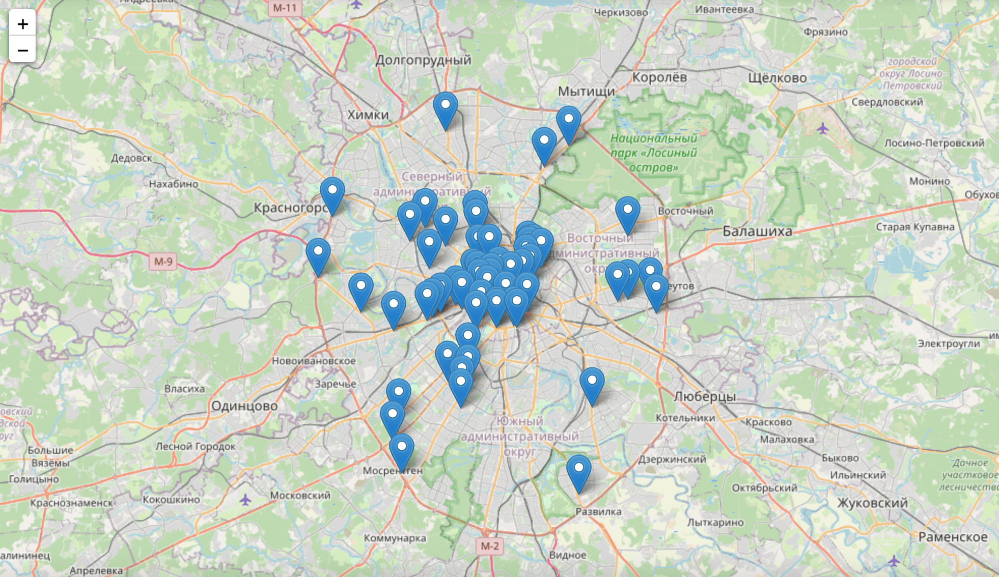

In [63]:
coffeeshops_24_7 = coffeeshops[coffeeshops['is_24/7'] == True]

# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его на карту
def create_marker(row):
    Marker([row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}"
    ).add_to(m)

# применяем функцию для создания маркера ко всем строкам датафрейма
coffeeshops_24_7.apply(create_marker, axis=1)
    
# выводим карту
# m

Image(filename='image5.png')

Всего 59 круглосуточных кофеен в Москве. Они единично распределены по всему городу, но больше всего таких кофеен в центре.

**Какие у кофеен рейтинги? Как они распределяются по районам?**

In [64]:
rating_coffeeshops = coffeeshops.groupby('district', as_index=False)['rating'].agg('median').sort_values(by='rating', ascending=False)
rating_coffeeshops

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


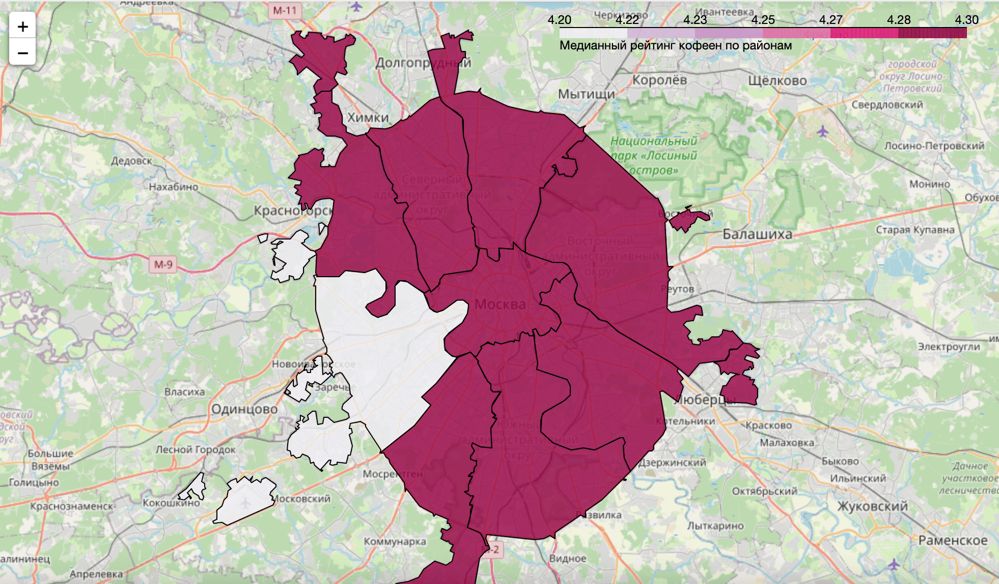

In [65]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/polinamokretsova/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_coffeeshops,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг кофеен по районам',
).add_to(m)

# выводим карту
# m

Image(filename='image6.png')

Рейтинги распределяются одинаково по всем районам, кроме Западного округа. Там рейтинг - 4.2, а у остальных районов - 4.3. Разница несущественная. 

**Определим, на какую стоимость чашки капучино стоит ориентироваться при открытии.**

In [66]:
coffeeshops['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

Если минимальная цена - 60 рублей еще похожа на правду(такая цена может быть в недорогих кофейнях, например, Cofix).
То максимальная цена 1568 рублей смущает. Посмотрим, что это за кофейня и может ли кофе стоить там столько.

In [67]:
coffeeshops[coffeeshops['middle_coffee_cup'] > 1000]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,Шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,сетевое,48.0,Большая Семёновская улица,False


Чашка капучино в "Шоколаднице" не стоит больше 1000 рублей. Скорее всего при вводе этих данных была допущена ошибка и средняя цена 290 рублей. Учтем это при рассчете средней стоимости капучино.

In [68]:
# перезапишем датасет без Шоколадницы с индексом в датасете 2859
coffeeshops = coffeeshops.reset_index()
coffeeshops = coffeeshops[coffeeshops['index'] != 2859]

In [69]:
# проверим, что теперь стоимость капучино не превышает 1000 рублей
coffeeshops[coffeeshops['middle_coffee_cup'] > 1000]

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7


In [70]:
# посмотрим, какая картина будет со стоимостью капучино сейчас
coffeeshops['middle_coffee_cup'].describe()

count    520.000000
mean     172.376923
std       65.767854
min       60.000000
25%      124.000000
50%      169.500000
75%      225.000000
max      375.000000
Name: middle_coffee_cup, dtype: float64

Максимальная стоимость капучино в нашем датасете 375 рублей. Это цена выше среднего, поэтому на эту стоимость при открытии заведения точно не нужно ориентироваться.

Средняя стоимость капучино по Москве - 172 рубля. **Можно ориентироваться на 150-180 рублей для начала. Така цена не удивит и не оттолкнет от покупки, так как является средней по городу.**

Но окончательная стоимость, на которую стоит оринетироваться, будет зависеть от района, где будет открыта кофейня. Посмотрим, как распределяется средняя цена за чашку капучино по районам.

In [71]:
# посмотрим нна стоимость капучино по районам
middle_coffeecup_district = coffeeshops.groupby('district', as_index=False)['middle_coffee_cup'].agg('median').sort_values(by='middle_coffee_cup', ascending=False)
middle_coffeecup_district

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


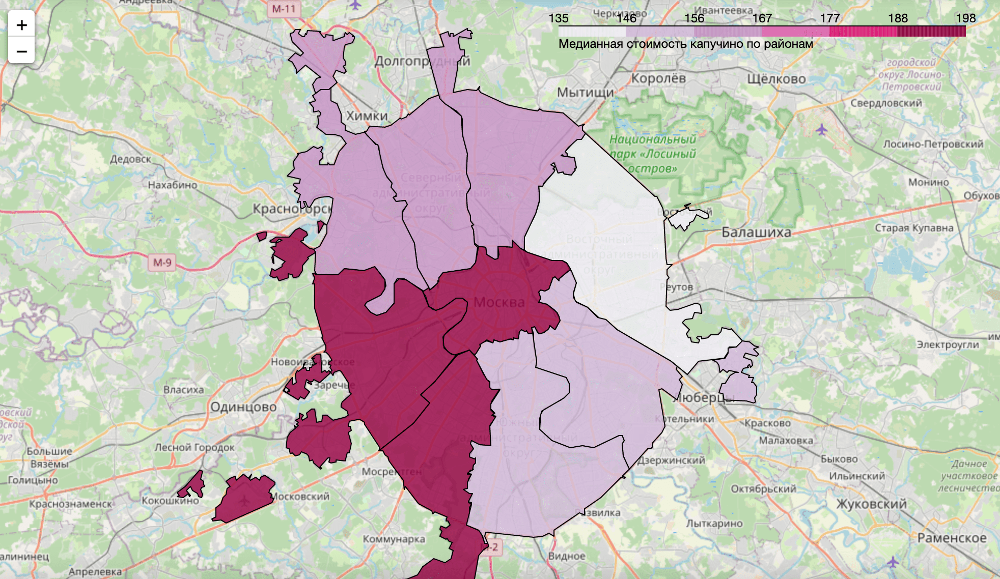

In [72]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/Users/polinamokretsova/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=middle_coffeecup_district,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    fill_color='PuRd',
    fill_opacity=0.8,
    legend_name='Медианная стоимость капучино по районам',
).add_to(m)

# выводим карту
# m

Image(filename='image7.png')

**Самый дорогой капучино** – в Центральном, Западном и Юго-Западном округах.\
**Самая низкая цена** - в Восточном округе.

**Рекомендации для открытия нового заведения**

Мы проанализировали рынок заведений общественного питания в Москве. Предлагаем рассмотреть несколько вариантов локаций для открытия кофейни: 
1. В центре города, несмотря на то, что там больше всего кофеен, выше средний чек и конкуренция, там больше всего "пустых" улиц, где располагается лишь один объект общепита, больше проходимость и возможность привлечения туристов к посещению кофейни (в дальний район туристы вряд ли поедут). Такими улицами могут быть, например: Большая Татарская улица, на которой находится только Мустафа Кебаб, или Малая Полянка, где располагается ресторан Онегинъ. Доступные кофейни на таких улицах не помешают.
2. На Западе Москвы цены на уровне центра города, но конкуренция меньше. Это дает возможность открыть доступную кофейню для жителей этого района. 
3. Меньше всего кофеен в Северо-Западном административном округе, это означает, что там ниже конкуренция и раскрутить качественную кофейню будет проще. 

Можно ориентироваться на среднюю стоимость капучино: 150-180 рублей для начала. Такая цена не удивит и не оттолкнет от покупки, так как является средней по городу. Более точную стоимость лучше рассчитывать, отталкиваясь от конкретного района.

Количество посадочных мест в заведении также будет зависеть от выбранного района. В среднем по городу в кофейнях от 50 до 70 посадочных мест.